In [1]:
import pandas as pd
import seaborn as sns
from sklearn.cluster import KMeans

# Business Understanding
We gaan kijken naar een dataset van huisverkopen in Californië

# Data Understanding

In [2]:
df = pd.read_csv('housing.csv')

In [3]:
df.head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,NEAR BAY
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,NEAR BAY
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,NEAR BAY
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,341300.0,NEAR BAY
4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,342200.0,NEAR BAY


In [4]:
# Er zijn lege velden!
df.dtypes

longitude             float64
latitude              float64
housing_median_age    float64
total_rooms           float64
total_bedrooms        float64
population            float64
households            float64
median_income         float64
median_house_value    float64
ocean_proximity        object
dtype: object

In [5]:
df.isna().sum()

longitude               0
latitude                0
housing_median_age      0
total_rooms             0
total_bedrooms        207
population              0
households              0
median_income           0
median_house_value      0
ocean_proximity         0
dtype: int64

In [6]:
df.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
longitude,20640.0,-119.569704,2.003532,-124.3500,-121.8000,-118.4900,-118.01000,-114.3100
latitude,20640.0,35.631861,2.135952,32.5400,33.9300,34.2600,37.71000,41.9500
housing_median_age,20640.0,28.639486,12.585558,1.0000,18.0000,29.0000,37.00000,52.0000
total_rooms,20640.0,2635.763081,2181.615252,2.0000,1447.7500,2127.0000,3148.00000,39320.0000
total_bedrooms,20433.0,537.870553,421.385070,1.0000,296.0000,435.0000,647.00000,6445.0000
population,20640.0,1425.476744,1132.462122,3.0000,787.0000,1166.0000,1725.00000,35682.0000
households,20640.0,499.539680,382.329753,1.0000,280.0000,409.0000,605.00000,6082.0000
median_income,20640.0,3.870671,1.899822,0.4999,2.5634,3.5348,4.74325,15.0001
median_house_value,20640.0,206855.816909,115395.615874,14999.0000,119600.0000,179700.0000,264725.00000,500001.0000


# Data Preparation
- willen ocean kolom af
- straks normaliseren (maar nu nog even niet)
- lege records
- x10000 voor median income

In [7]:
df = df.drop(columns=['ocean_proximity']) # kolomm weggooien

In [8]:
df = df.dropna()                          # lege records weggooien

In [9]:
df['median_income'] = df['median_income'] * 10000

Filteren op lon lat

In [10]:
df_lonlat = df[['longitude', 'latitude']].copy()

# Modeling
## Eerste model met KMeans (neem 6 clusters)

In [11]:
# Maak een model, maak een scatterplot met de labels uit je model. 

In [12]:
model = KMeans(n_clusters=6).fit(df_lonlat)

In [13]:
model.labels_ # voorspelling

array([0, 0, 0, ..., 5, 5, 5])

In [17]:
df_lonlat['cluster'].dtypes

dtype('int32')

In [18]:
# Geen integer meer, maar losse categoriën. Dit zorgt voor een mooiere plot
df_lonlat['cluster'] = df_lonlat['cluster'].astype('category')
df_lonlat['cluster'].dtypes

CategoricalDtype(categories=[0, 1, 2, 3, 4, 5], ordered=False)

<AxesSubplot:xlabel='longitude', ylabel='latitude'>

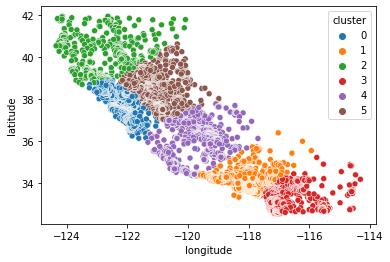

In [19]:
sns.scatterplot(x='longitude', y='latitude', hue='cluster', data=df_lonlat)

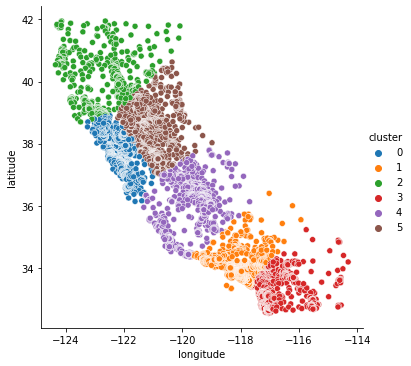

In [20]:
sns.relplot(x='longitude', y='latitude', hue='cluster', data=df_lonlat)

In [23]:
# Clusters gebaseerd op lon/lat ook toevoegen aan de hele dataset
df_oorspronkelijk = df.copy()
df_oorspronkelijk['cluster'] = model.labels_
df_oorspronkelijk['cluster'] = df_oorspronkelijk['cluster'].astype('category')

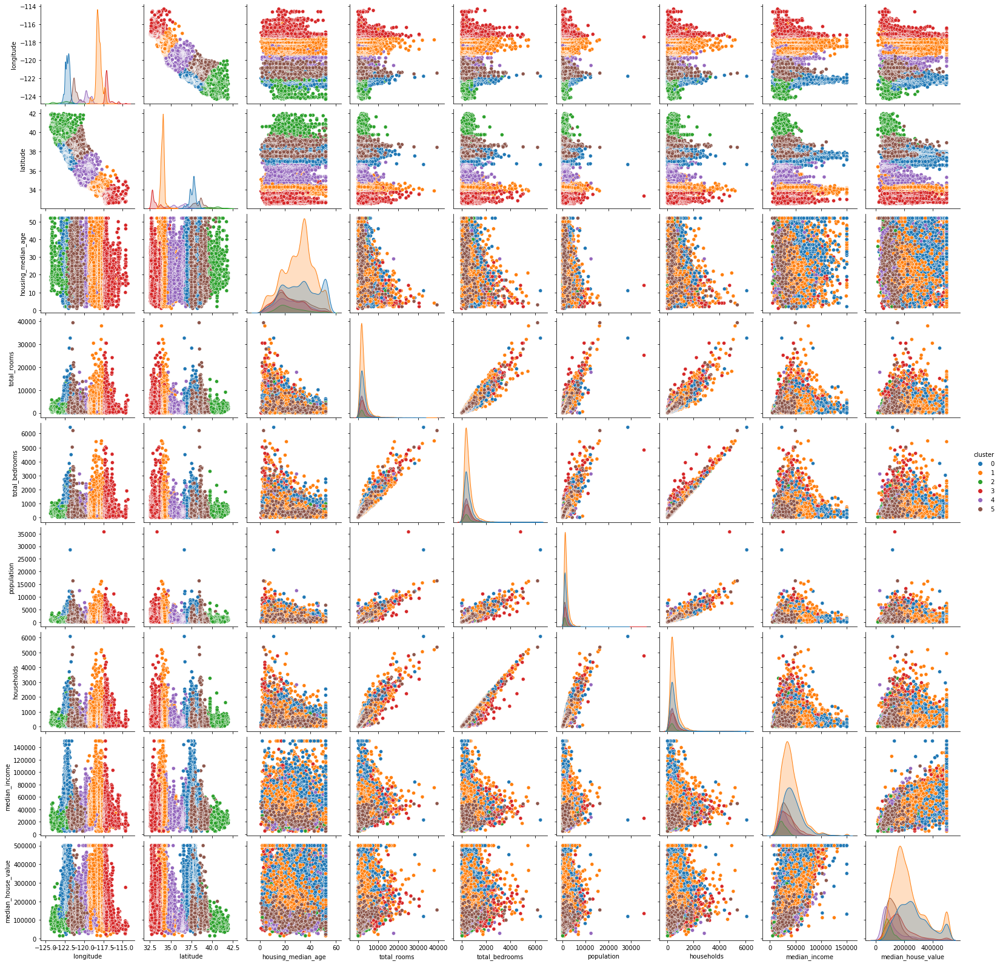

In [24]:
sns.pairplot(df_oorspronkelijk, hue='cluster')

In [25]:
df_oorspronkelijk.groupby('cluster')['housing_median_age'].mean()

cluster
0    32.169874
1    30.235060
2    24.596182
3    22.137108
4    25.096756
5    25.047681
Name: housing_median_age, dtype: float64

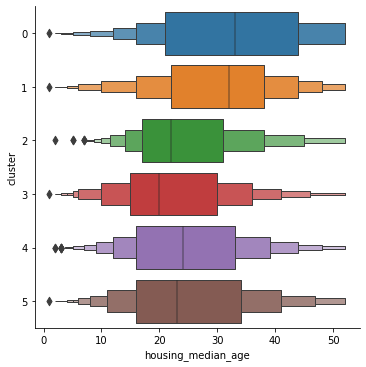

In [26]:
sns.catplot(x='housing_median_age', y='cluster', data=df_oorspronkelijk, kind='boxen')

## Nu een kmeans clustering op de gehele dataset. Begin met een elbow plot

In [27]:
df_model = df.copy()

In [28]:
n_clusters_to_test = range(2, 15)
inertias = []

for n in n_clusters_to_test:
    model = KMeans(n_clusters=n).fit(df_model)
    inertias.append(model.inertia_)

<AxesSubplot:>

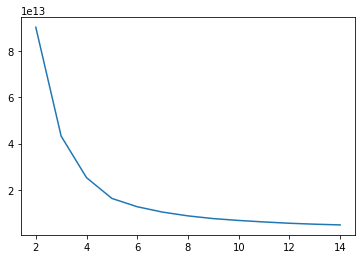

In [29]:
sns.lineplot(x=n_clusters_to_test, y=inertias)

In [30]:
model = KMeans(n_clusters=5).fit(df_model)

In [31]:
df_model['cluster'] = model.labels_

In [33]:
df_model['cluster'] = df_model['cluster'].astype('category')

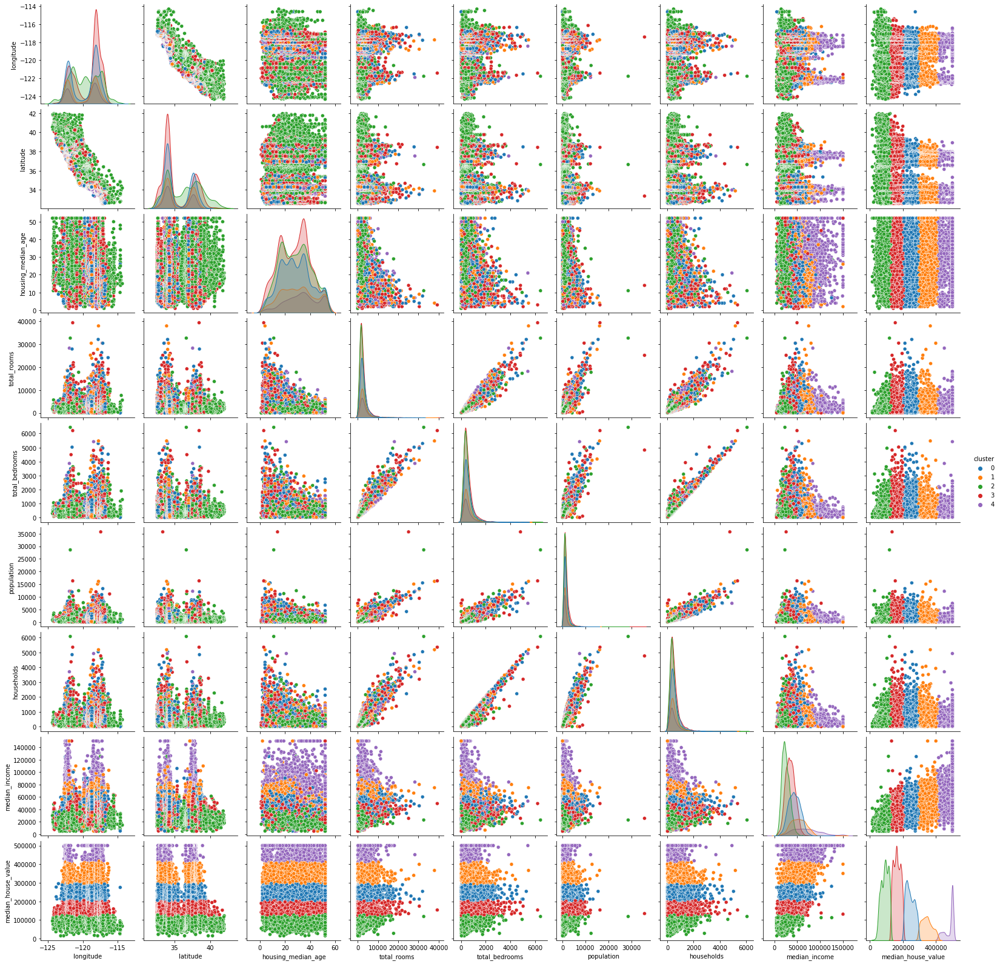

In [35]:
sns.pairplot(df_model, hue='cluster')

Zie de rechte banden in de onderste rij. Als je dit ziet is het nodig om te normaliseren

## Hele dataset, maar nu met normalisatie

In [36]:
df_normalised = df.copy()

In [40]:
df_normalised.describe().transpose()[['min', 'max']]

,min,max
longitude,-124.35,-114.31
latitude,32.54,41.95
housing_median_age,1.00,52.00
total_rooms,2.00,39320.00
total_bedrooms,1.00,6445.00
population,3.00,35682.00
households,1.00,6082.00
median_income,4999.00,150001.00
median_house_value,14999.00,500001.00


In [43]:
df_normalised = df_normalised - df_normalised.min()

In [45]:
df_normalised = df_normalised / df_normalised.max()

In [46]:
df_normalised.describe().transpose()[['min', 'max']]

,min,max
longitude,0.0,1.0
latitude,0.0,1.0
housing_median_age,0.0,1.0
total_rooms,0.0,1.0
total_bedrooms,0.0,1.0
population,0.0,1.0
households,0.0,1.0
median_income,0.0,1.0
median_house_value,0.0,1.0


Nu weer de elbow

<AxesSubplot:>

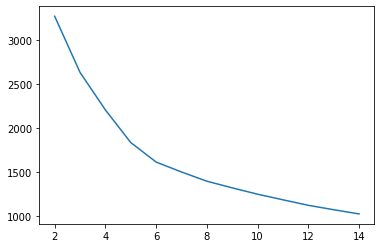

In [47]:
n_clusters_to_test = range(2, 15)
inertias = []

for n in n_clusters_to_test:
    model = KMeans(n_clusters=n).fit(df_normalised)
    inertias.append(model.inertia_)

sns.lineplot(x=n_clusters_to_test, y=inertias)

In [48]:
model = KMeans(n_clusters=6).fit(df_normalised)



In [49]:
df_normalised['cluster'] = model.labels_
df_normalised['cluster'] = df_normalised['cluster'].astype('category')

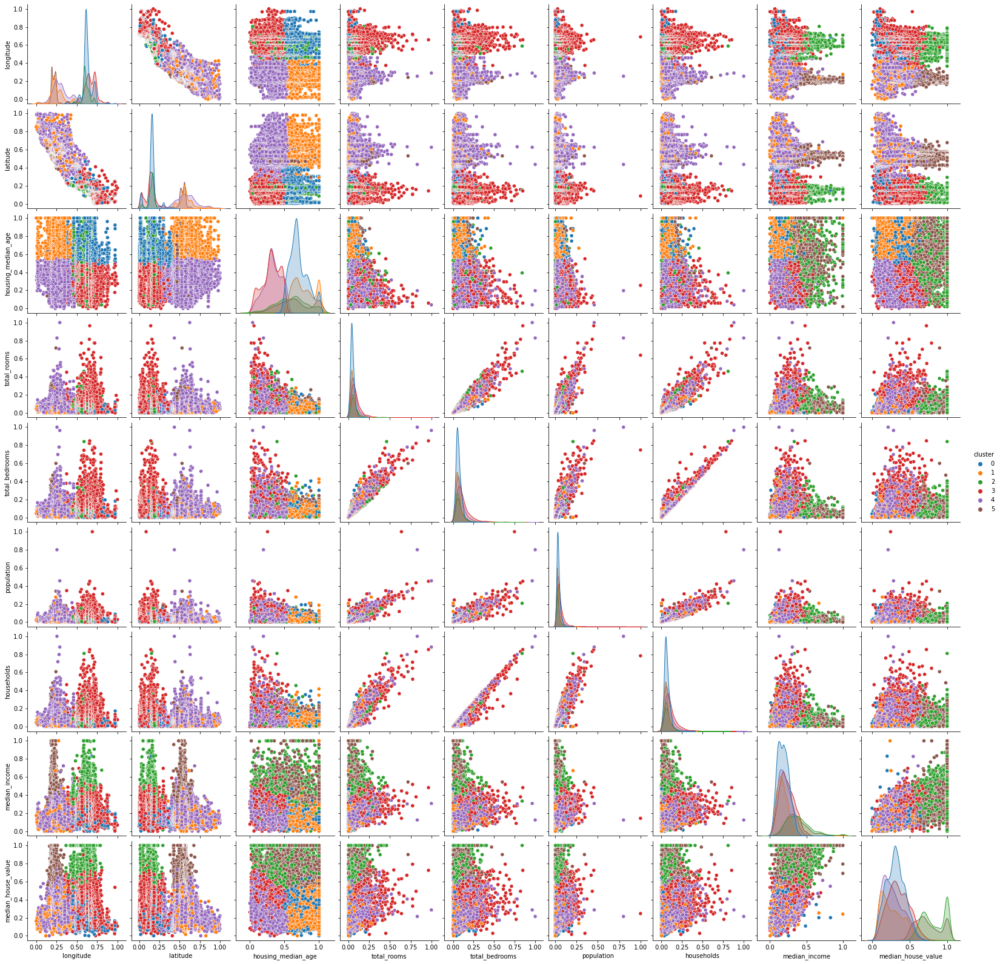

In [50]:
sns.pairplot(df_normalised, hue='cluster')

In [51]:
df['cluster'] = model.labels_
df['cluster'] = df['cluster'].astype('category')

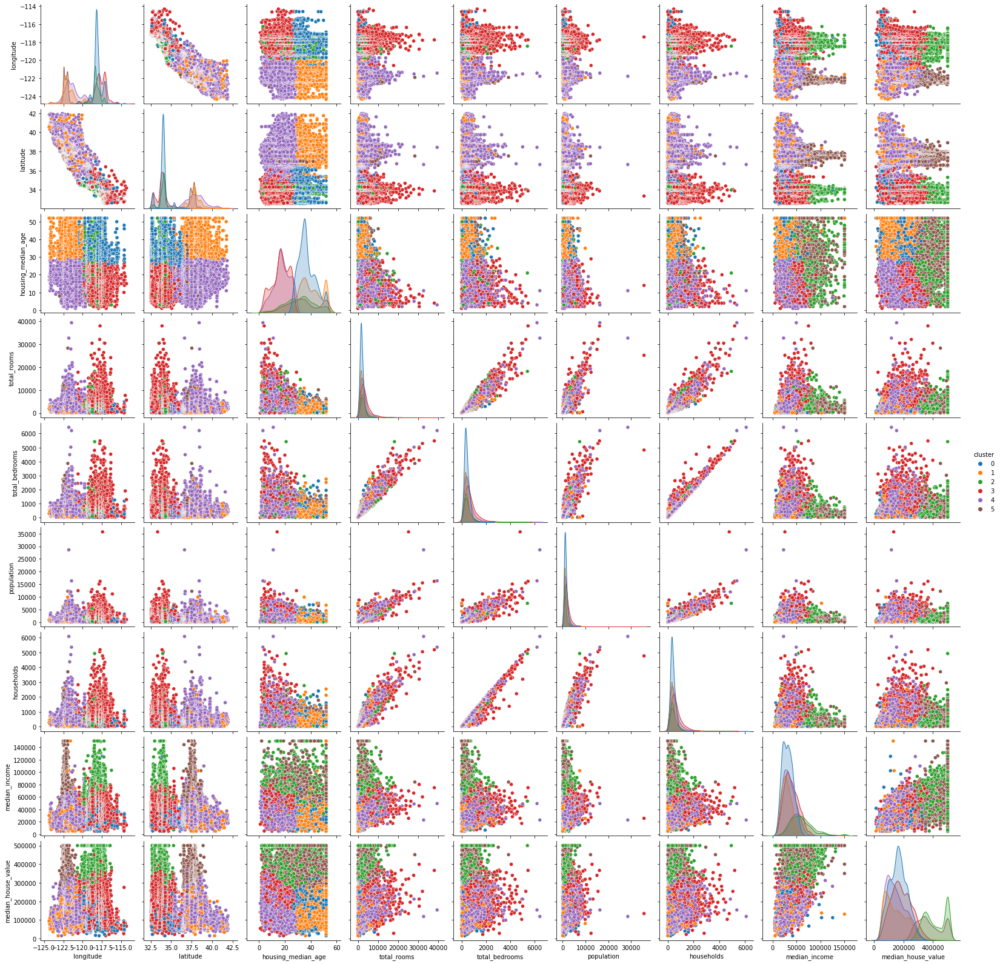

In [52]:
sns.pairplot(df, hue='cluster')

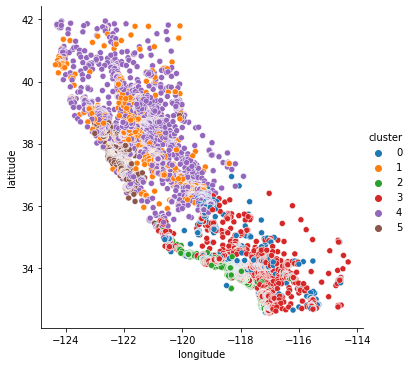

In [53]:
sns.relplot(x='longitude', y='latitude', hue='cluster', data=df)

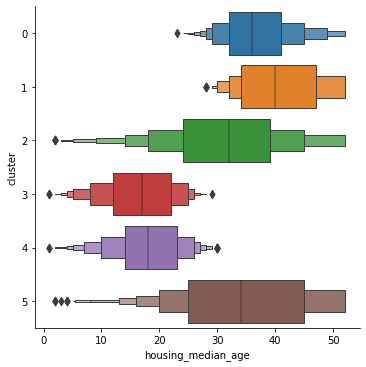

In [55]:
sns.catplot(x='housing_median_age', y='cluster', data=df, kind='boxen')

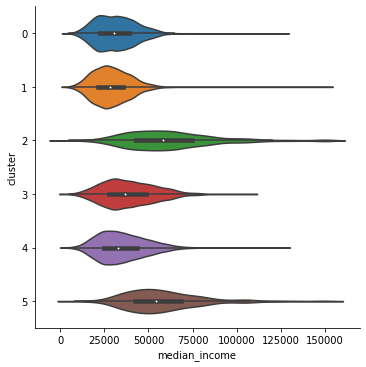

In [59]:
sns.catplot(x='median_income', y='cluster', data=df, kind='violin')